In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

In [2]:
red = pd.read_csv('winequality-red.csv',sep=';')
white = pd.read_csv("winequality-white.csv",sep=';')

In [3]:
red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [5]:
# adding the new features for the red wine because we are adding both wine into one and do some EDA
color_r = np.full((len(red),), 'red')

In [6]:
color_r

array(['red', 'red', 'red', ..., 'red', 'red', 'red'], dtype='<U3')

In [7]:
red['color']= color_r

In [8]:
red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [9]:
color_w = np.full(len(white),'white')

In [10]:
white['color'] = color_w

In [11]:
white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white


In [12]:
data = pd.concat([red,white],axis=0)

In [13]:
print('length of whitewine: ', len(white))
print('length of red wine: ', len(red))
print('length of data : ', len(data))

length of whitewine:  4898
length of red wine:  1599
length of data :  6497


In [14]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


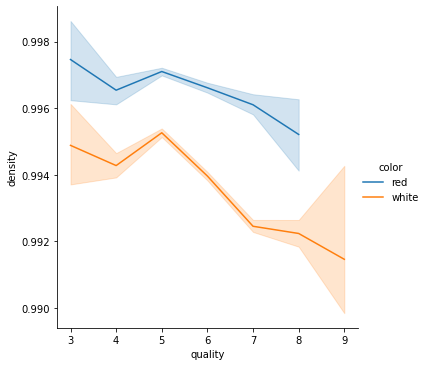

In [15]:
sns.relplot(x="quality", y="density", hue="color", kind="line", data=data);

Text(0, 0.5, 'quality')

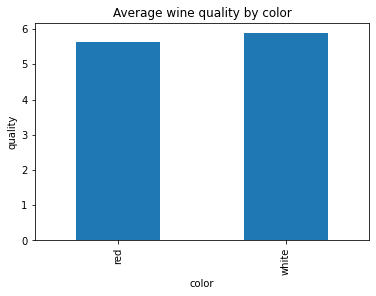

In [16]:
data.groupby('color')['quality'].mean().plot(kind='bar',)
plt.title('Average wine quality by color')
# plt.xlabel('color')
plt.ylabel('quality')


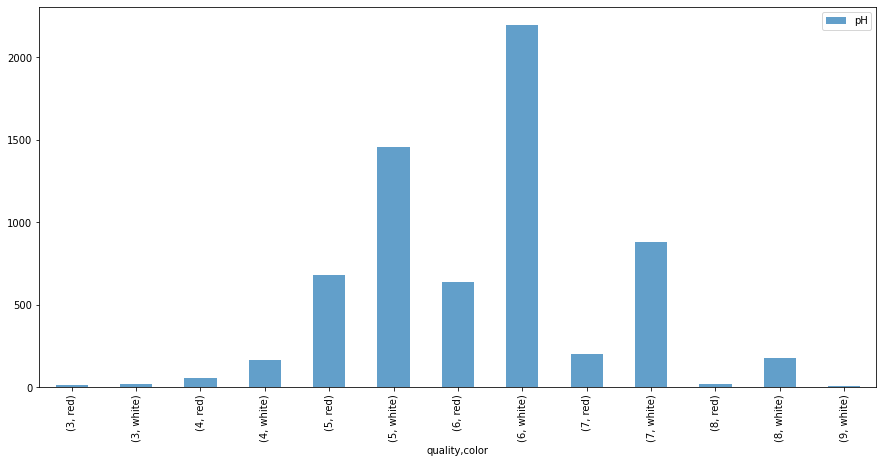

In [17]:
plt.figure(figsize=(10,8))
data.groupby(['quality','color']).count()['pH'].plot(kind='bar',alpha=.7,figsize=(15,7))
plt.legend(bbox_to_anchor=(1,1))

In [18]:
#getting the html file of tthe description of the all features
report = ProfileReport(data)
report.to_file('output.html')

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
data.profile_report()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
corr = data.corr()



In [21]:
corr = len(corr[corr>.5].columns)

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
x= data.drop(['color','quality'],axis=1)
y = data.quality
x.shape,y.shape

((6497, 11), (6497,))

In [24]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y,train_size=.8)

In [25]:
import tensorflow as tf
from tensorflow import keras

In [26]:
# ## creating the ann 
# model = keras.models.Sequential()
# model.add(keras.layers.Dense(30, input_dim=data.shape[1]),activation='relu')
data.shape

(6497, 13)

In [31]:
## creating the ANNs 
model = keras.models.Sequential()
model.add(keras.layers.Dense(100,input_dim=x.shape[1], activation='relu' ))
model.add(keras.layers.Dropout(0.15))
model.add(keras.layers.Dense(100, activation='relu'))
model.add(keras.layers.Dropout(0.15))
model.add(keras.layers.Dense(100,activation='relu'))
model.add(keras.layers.Dropout(0.15))
model.add(keras.layers.Dense(1,activation='linear'))

In [32]:
model.compile(loss='mse', optimizer='rmsprop')

In [33]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 100)               1200      
_________________________________________________________________
dropout_3 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               10100     
_________________________________________________________________
dropout_4 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 100)               10100     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                

In [35]:
fit = model.fit(xtrain,ytrain,batch_size=32, epochs=20, verbose=2, validation_split=0.15)

Epoch 1/20
139/139 - 0s - loss: 0.9428 - val_loss: 4.8355
Epoch 2/20
139/139 - 0s - loss: 0.9150 - val_loss: 2.7207
Epoch 3/20
139/139 - 0s - loss: 0.9082 - val_loss: 1.9991
Epoch 4/20
139/139 - 0s - loss: 0.8992 - val_loss: 1.4674
Epoch 5/20
139/139 - 0s - loss: 0.8944 - val_loss: 0.6420
Epoch 6/20
139/139 - 0s - loss: 0.8646 - val_loss: 1.1065
Epoch 7/20
139/139 - 0s - loss: 0.8694 - val_loss: 0.8584
Epoch 8/20
139/139 - 0s - loss: 0.8687 - val_loss: 0.6701
Epoch 9/20
139/139 - 0s - loss: 0.8799 - val_loss: 1.5367
Epoch 10/20
139/139 - 0s - loss: 0.8329 - val_loss: 0.5552
Epoch 11/20
139/139 - 0s - loss: 0.8456 - val_loss: 2.1772
Epoch 12/20
139/139 - 0s - loss: 0.8370 - val_loss: 0.9543
Epoch 13/20
139/139 - 0s - loss: 0.8342 - val_loss: 4.2541
Epoch 14/20
139/139 - 0s - loss: 0.8162 - val_loss: 0.7052
Epoch 15/20
139/139 - 0s - loss: 0.8063 - val_loss: 1.0557
Epoch 16/20
139/139 - 0s - loss: 0.8038 - val_loss: 0.6315
Epoch 17/20
139/139 - 0s - loss: 0.8018 - val_loss: 0.7280
Epoch 

In [38]:
fit.history.keys()

dict_keys(['loss', 'val_loss'])

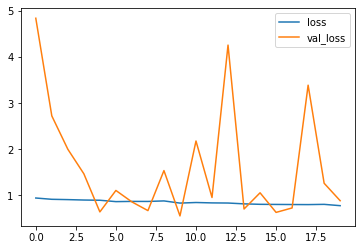

In [40]:
plt.plot(fit.history['loss'])
plt.plot(fit.history['val_loss'])
plt.legend(['loss','val_loss'])

In [47]:
predict = model.predict(xtest)